# How to Renovate Your Room [img2img]

- https://medium.com/@melgor89/generative-interior-design-challenge-2024-2nd-place-solution-6338f19f6fe3

In [2]:
import gc
import cv2
import time
import torch
import textwrap
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from importlib.metadata import version

props = torch.cuda.get_device_properties(0)
gpu_info = f"{torch.cuda.get_device_name(0)} ({props.total_memory/1024**3:.1f} GB)"

requirements_by_category = {
    "##### GPU #####": [
        f"GPU count: {torch.cuda.device_count()}",
        f"GPU 0: {gpu_info}",
        f"CUDA version: {torch.version.cuda}",
    ],
    "##### Diffusion & AI #####": [
        f"diffusers=={version('diffusers')}",
        f"transformers=={version('transformers')}",
        f"accelerate=={version('accelerate')}",
        f"safetensors=={version('safetensors')}",
        f"torch=={version('torch')}",
        f"xformers=={version('xformers')}",
    ],
    "##### Image Processing #####": [
        f"numpy=={version('numpy')}",
        f"opencv-python-headless=={version('opencv-python-headless')}",
        f"Pillow=={version('Pillow')}",
    ]
}

for category, reqs in requirements_by_category.items():
    print(category)
    for req in sorted(reqs, key=str.lower):
        print(req)
    print()

##### GPU #####
CUDA version: 12.1
GPU 0: NVIDIA Graphics Device (47.5 GB)
GPU count: 4

##### Diffusion & AI #####
accelerate==1.9.0
diffusers==0.35.0.dev0
safetensors==0.6.1
torch==2.5.1+cu121
transformers==4.54.1
xformers==0.0.29.post1

##### Image Processing #####
numpy==2.1.2
opencv-python-headless==4.10.0.84
Pillow==9.4.0



In [3]:
def display_images(images: list, titles: list = None, grid: tuple = (1, None), figsize: tuple = (15, 5), show_axes: bool = True):
    """Отображает изображения с авто-генерацией технических заголовков."""
    if not images: return

    if titles is None:
        titles = []
        for i, img in enumerate(images):
            # Проверяем тип объекта: NumPy array или PIL Image
            if isinstance(img, np.ndarray):
                mode = 'N/A'
                if len(img.shape) == 2: mode = "L"
                elif img.shape[2] == 3: mode = 'RGB'
                elif img.shape[2] == 4: mode = 'RGBA'
                titles.append(f"img{i}, {img.shape}, {mode}")
            # Для PIL и подобных объектов с атрибутами size, mode
            elif hasattr(img, 'size'):
                titles.append(f"img{i}, {img.size}, {img.mode}, {getattr(img, 'format', None)}")
            else:
                titles.append(f"img{i}")

    num_images = len(images)
    rows, cols = grid
    if cols is None:
        cols = (num_images + rows - 1) // rows

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.ravel(axes)

    for i, ax in enumerate(axes):
        if i < num_images:
            ax.imshow(images[i])
            if titles: ax.set_title(titles[i])
            if not show_axes: ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

def cleanup(*objs, device="cuda:2", verbose=True):
    for obj in objs:
        del obj
    gc.collect()
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()

    d = device or torch.cuda.current_device()
    if verbose:
        alloc = torch.cuda.memory_allocated(d) / 1024**2
        reserved = torch.cuda.memory_reserved(d) / 1024**2
        print(f"[Cleanup] Dev{d} | Allocated: {alloc:.2f} MB | Reserved: {reserved:.2f} MB")

# Step 1: img2img

**Задача:** клиент хочет быстро представить, как может выглядеть его будущий ремонт в текущей квартире - даём текстовый запрос, исходное изображение и получаем визуализацию

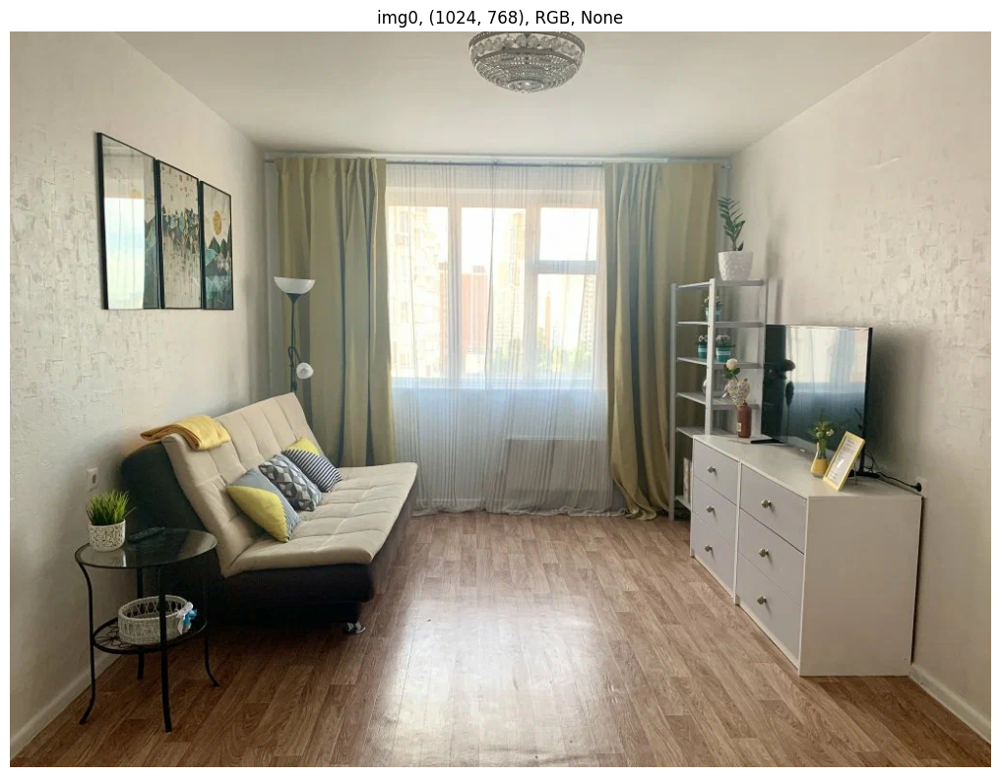

In [11]:
# Замена цвета ключевого объекта
easy_prompt = (
    "A modern living room with a green leather sofa."
)

# Добавляем детали и меняем окружение
medium_prompt = (
    "A modern living room with a green leather sofa against a clean, white brick wall. "
    "A large monstera plant stands on the floor next to the white cabinets."
)

# Радикальная смена стиля и атмосферы
hard_prompt = (
    "A cozy living room in a wooden cabin at night. A green leather sofa sits on a dark wood floor. "
    "A fire is burning in a stone fireplace on the right. "
    "The only light comes from the fire and a small table lamp. Moody, cinematic."
)

img_pil = Image.open('data/img5004_BDorig.jpg').convert('RGB')
display_images([img_pil], figsize=(15, 8), show_axes=False)

## [stable-diffusion-v1-5/stable-diffusion-v1-5](https://huggingface.co/docs/diffusers/en/using-diffusers/img2img#stable-diffusion-v15) [Oct 2022]

- **Зачем смотрим:** Классическая базовая модель, стандарт для своего времени
- ✅ Быстрая и простая
- ✅ Низкие требования к VRAM (fp16): ~4-6 GB для генерации
- ✅ Отличная база для дообучения (fine-tuning)
- ❌ Плохо понимает сложные промпты
- ❌ Устаревший фотореализм и детализация
- Родное разрешение: 512x512

In [6]:
model_name = "stable-diffusion-v1-5/stable-diffusion-v1-5"
device = 'cuda:2'
torch_dtype = torch.float16
seed = 5

params = {
    "image": img_pil.resize((512, 512)),
    "num_inference_steps": 100
}

In [7]:
from diffusers import AutoPipelineForImage2Image

torch.cuda.reset_peak_memory_stats(device)
pipe = AutoPipelineForImage2Image.from_pretrained(model_name, torch_dtype=torch_dtype, use_safetensors=True).to(device)
print(f"Peak after load: {torch.cuda.max_memory_allocated(device)/1024**3:.2f} GB")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Peak after load: 2.58 GB


### Easy Prompt

In [8]:
params['prompt'] = easy_prompt
params['strength'] = 0.45
params['generator'] = torch.Generator(device).manual_seed(seed)

torch.cuda.reset_peak_memory_stats(device)
start_time = time.time()

pipe_result_easy = pipe(**params).images[0]

torch.cuda.synchronize(device)
end_time = time.time()

gpu_mem = torch.cuda.max_memory_allocated(device) / 1024**3
print(f"Generation time: {end_time - start_time:.2f}s")
print(f"Peak GPU memory consumption: {gpu_mem:.2f}Gb")

  0%|          | 0/45 [00:00<?, ?it/s]

Generation time: 2.74s
Peak GPU memory consumption: 3.18Gb


A modern living room with a green leather sofa.


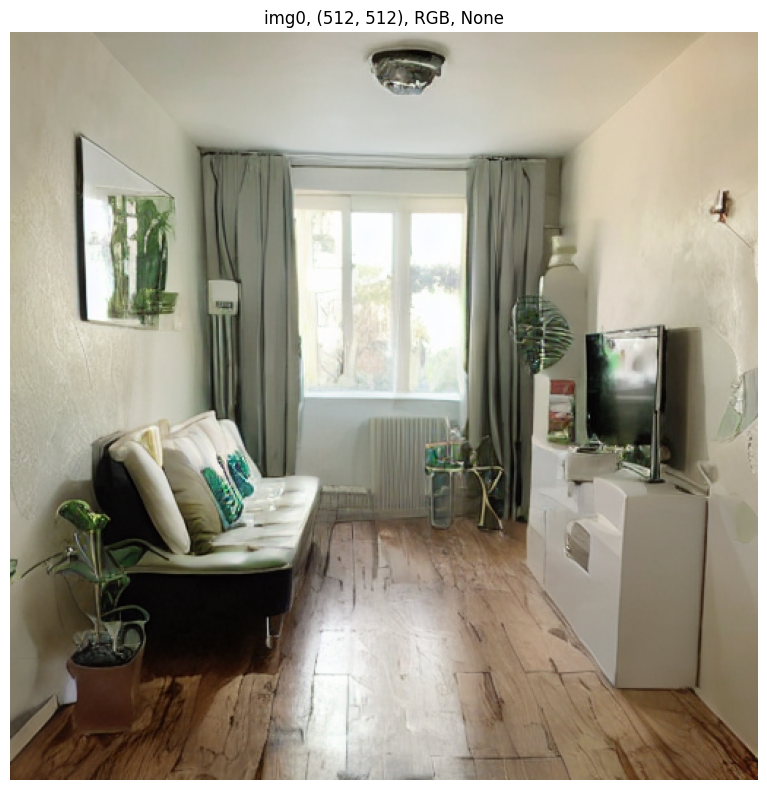

In [9]:
print(textwrap.fill(easy_prompt))
display_images([pipe_result_easy], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ❌ Промпт проигнорирован — диван не изменил цвет
- ❌ Появились сильные артефакты на стенах и мебели
- ✅ Композиция комнаты в целом сохранена

### Medium Prompt

  0%|          | 0/65 [00:00<?, ?it/s]

A modern living room with a green leather sofa against a clean, white
brick wall. A large monstera plant stands on the floor next to the
white cabinets.


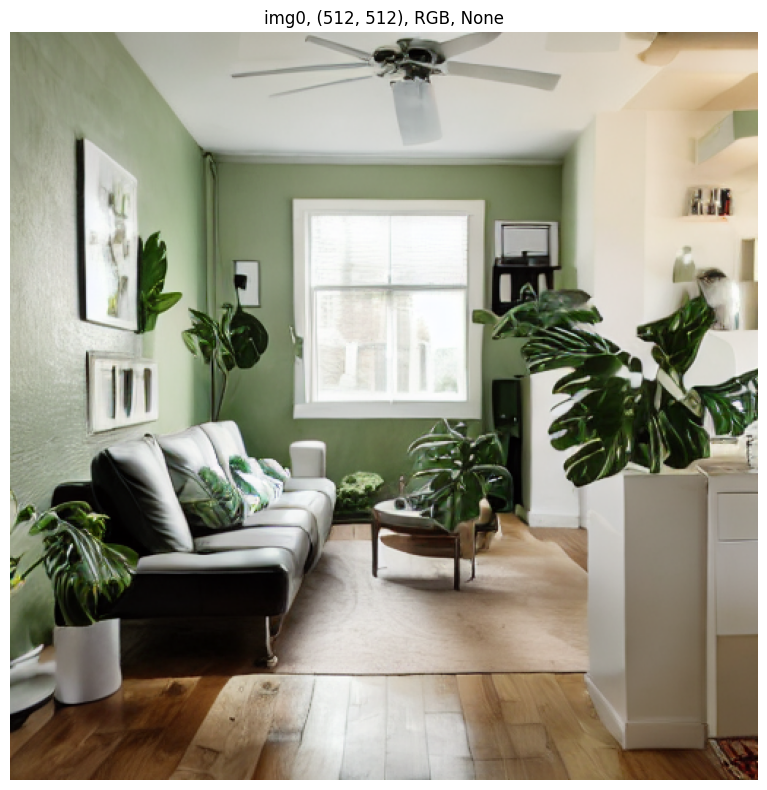

In [10]:
params['prompt'] = medium_prompt
params['strength'] = 0.65
params['generator'] = torch.Generator(device).manual_seed(seed)
pipe_result_medium = pipe(**params).images[0]

print(textwrap.fill(medium_prompt))
display_images([pipe_result_medium], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Диван стал зеленым
- ❌ Исходная композиция полностью потеряна
- ❌ Промпт выполнен частично (нет кирпичной стены, нет растения)

### Hard Prompt

  0%|          | 0/80 [00:00<?, ?it/s]

A cozy living room in a wooden cabin at night. A green leather sofa
sits on a dark wood floor. A fire is burning in a stone fireplace on
the right. The only light comes from the fire and a small table lamp.
Moody, cinematic.


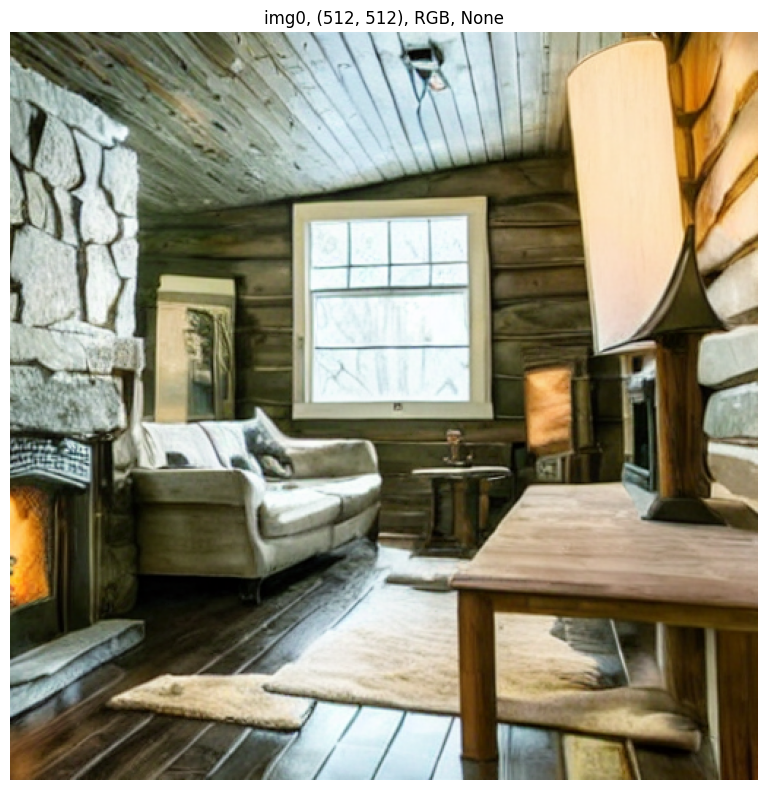

In [11]:
params['prompt'] = hard_prompt
params['strength'] = 0.8
params['generator'] = torch.Generator(device).manual_seed(seed)
pipe_result_hard = pipe(**params).images[0]

print(textwrap.fill(hard_prompt))
display_images([pipe_result_hard], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Атмосфера из промпта успешно передана
- ❌ Связь с оригинальным изображением отсутствует
- ❌ Модель сработала в режиме чистого txt2img

### Comparing

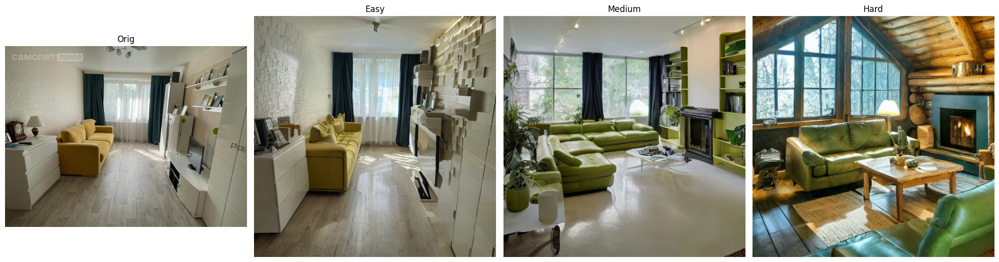

In [16]:
display_images(
    images=[img_pil, pipe_result_easy, pipe_result_medium, pipe_result_hard],
    titles=['Orig', 'Easy', 'Medium', 'Hard'],
    show_axes=False,
    figsize=(20, 12)
)

In [17]:
cleanup(pipe)

[Cleanup] Devcuda:2 | Allocated: 2646.01 MB | Reserved: 2690.00 MB


## [stabilityai/stable-diffusion-xl-base-1.0](https://huggingface.co/docs/diffusers/en/using-diffusers/img2img#stable-diffusion-xl-sdxl) [Oct 2023]

- **Зачем смотрим:** Современный стандарт, огромный скачок в качестве и понимании промптов.
- ✅ Превосходный фотореализм и детализация.
- ✅ Отлично понимает длинные и сложные промпты.
- ✅ Работает хорошо без "магии" с негативными промптами.
- ❌ Значительно выше требования к VRAM (fp16): ~12-16 GB для комфортной генерации.
- ❌ Медленнее, чем v1.5.
- Родное разрешение: 1024x1024.

In [5]:
model_name = "stabilityai/stable-diffusion-xl-refiner-1.0"
device = 'cuda:2'
torch_dtype = torch.float16
seed = 5

params = {
    "image": img_pil,
    "num_inference_steps": 100
}

In [6]:
from diffusers import AutoPipelineForImage2Image

torch.cuda.reset_peak_memory_stats(device)
pipe = AutoPipelineForImage2Image.from_pretrained(model_name, torch_dtype=torch_dtype, use_safetensors=True, variant="fp16").to(device)
print(f"Peak after load: {torch.cuda.max_memory_allocated(device)/1024**3:.2f} GB")

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Peak after load: 5.73 GB


### Easy Prompt

In [9]:
params['prompt'] = easy_prompt
params['strength'] = 0.45
params['generator'] = torch.Generator(device).manual_seed(seed)

torch.cuda.reset_peak_memory_stats(device)
start_time = time.time()

pipe_result_easy = pipe(**params).images[0]

torch.cuda.synchronize(device)
end_time = time.time()

gpu_mem = torch.cuda.max_memory_allocated(device) / 1024**3
print(f"Generation time: {end_time - start_time:.2f}s")
print(f"Peak GPU memory consumption: {gpu_mem:.2f}Gb")

  0%|          | 0/45 [00:00<?, ?it/s]

Generation time: 6.96s
Peak GPU memory consumption: 8.87Gb


A modern living room with a green leather sofa.


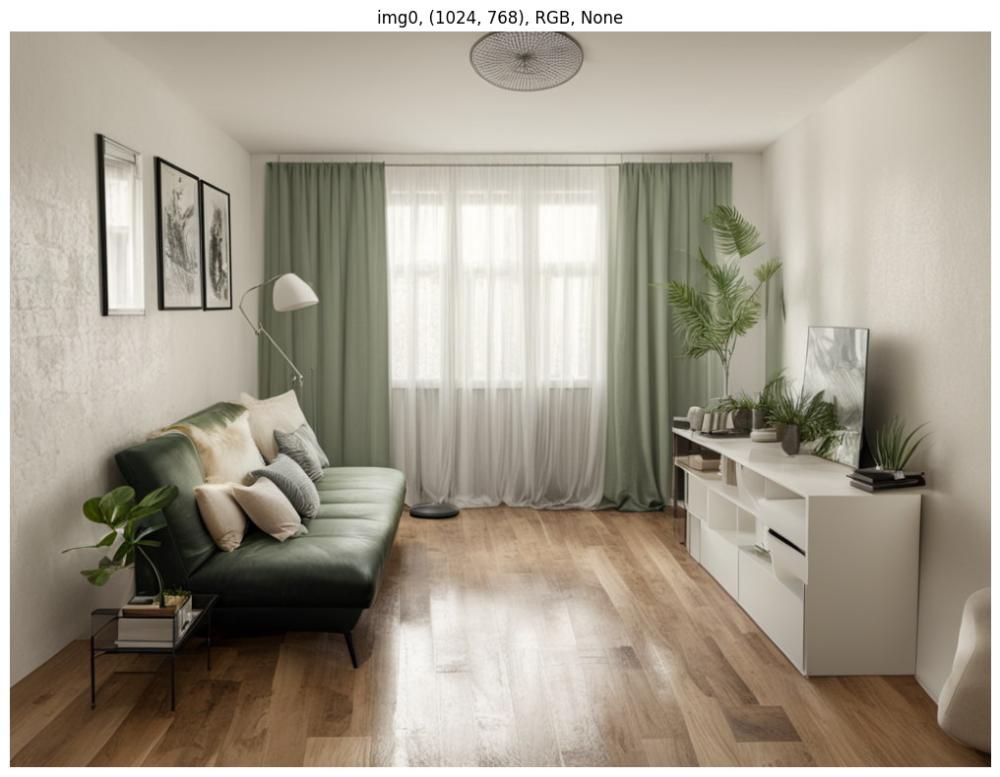

In [10]:
print(textwrap.fill(easy_prompt))
display_images([pipe_result_easy], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Идеально сохранена композиция и освещение
- ✅ Результат стал чище и фотореалистичнее
- ❌ Промпт проигнорирован: диван не поменял цвет. Модель слишком сильно "держалась" за оригинал

### Medium Prompt

  0%|          | 0/65 [00:00<?, ?it/s]

A modern living room with a green leather sofa against a clean, white
brick wall. A large monstera plant stands on the floor next to the
white cabinets.


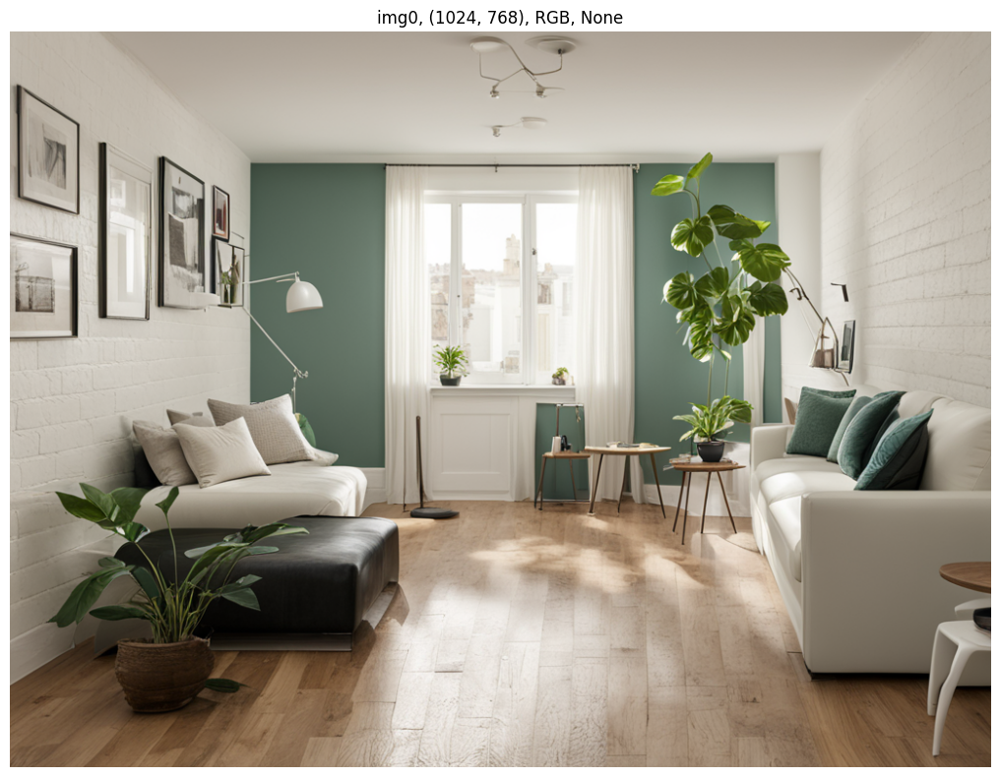

In [8]:
params['prompt'] = medium_prompt
params['strength'] = 0.65
params['generator'] = torch.Generator(device).manual_seed(seed)
pipe_result_medium = pipe(**params).images[0]

print(textwrap.fill(medium_prompt))
display_images([pipe_result_medium], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Промпт выполнен полностью: диван зеленый, стена кирпичная, растение добавлено
- ✅ Основная композиция (расположение дивана, окна) сохранена
- ✅ Высокое качество и фотореализм

### Hard Prompt

  0%|          | 0/80 [00:00<?, ?it/s]

A cozy living room in a wooden cabin at night. A green leather sofa
sits on a dark wood floor. A fire is burning in a stone fireplace on
the right. The only light comes from the fire and a small table lamp.
Moody, cinematic.


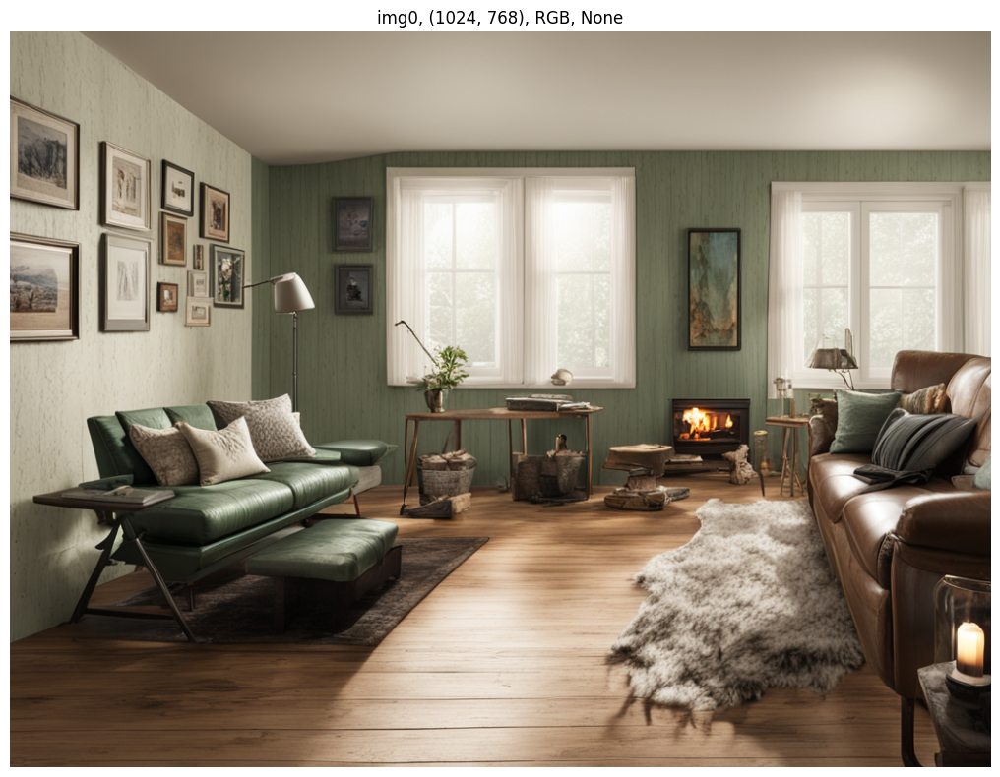

In [7]:
params['prompt'] = hard_prompt
params['strength'] = 0.8
params['generator'] = torch.Generator(device).manual_seed(seed)
pipe_result_hard = pipe(**params).images[0]

print(textwrap.fill(hard_prompt))
display_images([pipe_result_hard], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Атмосфера и стиль из сложного промпта переданы превосходно
- ✅ Исходная композиция почти полностью изменена, что ожидаемо при высоком strength
- ✅ Модель адаптировала цвет дивана (стал коричневым), чтобы он лучше вписывался в новый стиль

### Comapring

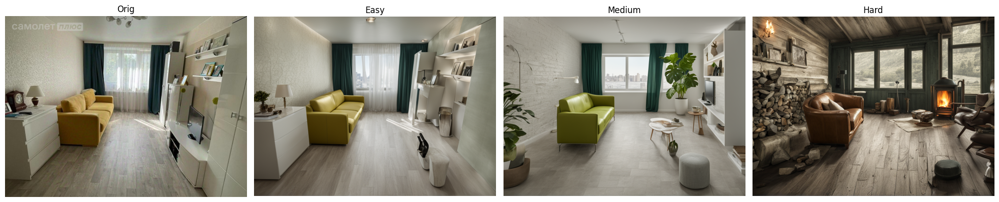

In [31]:
display_images(
    images=[img_pil, pipe_result_easy, pipe_result_medium, pipe_result_hard],
    titles=['Orig', 'Easy', 'Medium', 'Hard'],
    show_axes=False,
    figsize=(20, 12)
)

In [32]:
cleanup(pipe)

[Cleanup] Devcuda:2 | Allocated: 5880.46 MB | Reserved: 6478.00 MB


## [kandinsky-community/kandinsky-2-2-decoder](https://huggingface.co/docs/diffusers/en/using-diffusers/img2img?utm_source=chatgpt.com) [Oct 2023]

- **Зачем смотрим:** Альтернативная архитектура (не Stable Diffusion), известная своей "художественностью" и хорошим пониманием языков.
- ✅ Высокое эстетическое качество генераций.
- ✅ Отлично смешивает изображения и текст.
- ✅ Имеет встроенные ControlNet и Inpainting модели.
- ❌ Требует двух моделей для работы (Prior и Decoder), что усложняет пайплайн.
- ❌ Может быть медленнее SD из-за двухступенчатого процесса.
- Родное разрешение: 1024x1024.
- VRAM (fp16): Суммарно требует >16 GB для быстрой работы.

In [42]:
model_name = "kandinsky-community/kandinsky-2-2-decoder"
device = 'cuda:2'
torch_dtype = torch.float16
seed = 5

params = {
    "image": img_pil,
    "num_inference_steps": 100,
    "height": 1024,
    "width": 1024
}

In [43]:
from diffusers import AutoPipelineForImage2Image

torch.cuda.reset_peak_memory_stats(device)
pipe = AutoPipelineForImage2Image.from_pretrained(model_name, torch_dtype=torch_dtype, use_safetensors=True).to(device)
print(f"Peak after load: {torch.cuda.max_memory_allocated(device)/1024**3:.2f} GB")

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Peak after load: 18.38 GB


### Easy Prompt

In [44]:
params['prompt'] = easy_prompt
params['strength'] = 0.45
params['generator'] = torch.Generator(device).manual_seed(seed)

torch.cuda.reset_peak_memory_stats(device)
start_time = time.time()

pipe_result_easy = pipe(**params).images[0]

torch.cuda.synchronize(device)
end_time = time.time()

gpu_mem = torch.cuda.max_memory_allocated(device) / 1024**3
print(f"Generation time: {end_time - start_time:.2f}s")
print(f"Peak GPU memory consumption: {gpu_mem:.2f}Gb")

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Generation time: 6.49s
Peak GPU memory consumption: 11.71Gb


A modern living room with a green leather sofa.


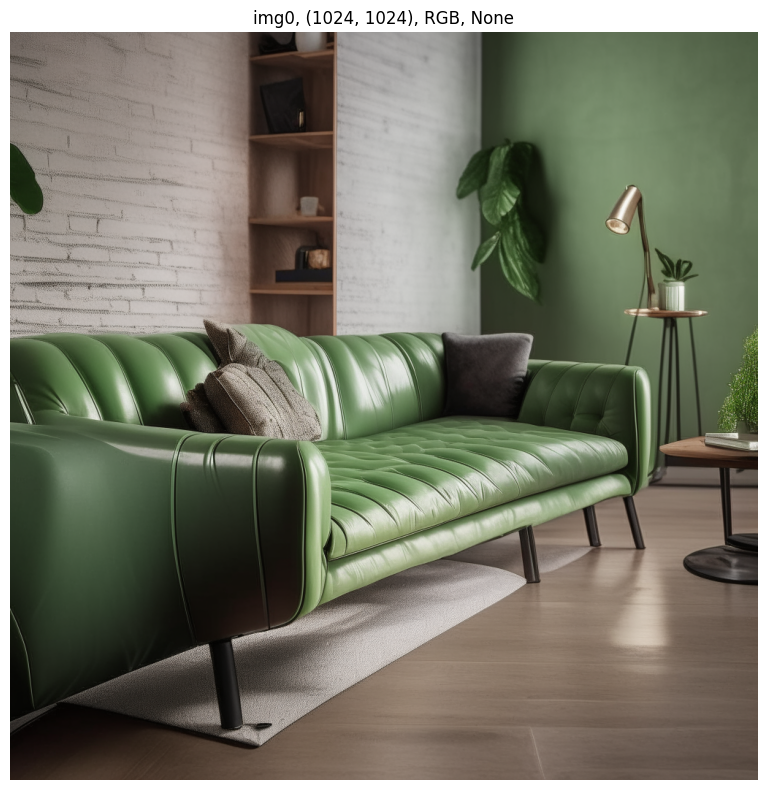

In [45]:
print(textwrap.fill(easy_prompt))
display_images([pipe_result_easy], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Диван стал зеленым и кожаным, как в промпте
- ❌ Композиция полностью проигнорирована
- ✅❌ Модель сгенерировала эстетически приятную, но совершенно новую сцену

### Medium Prompt

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

A modern living room with a green leather sofa against a clean, white
brick wall. A large monstera plant stands on the floor next to the
white cabinets.


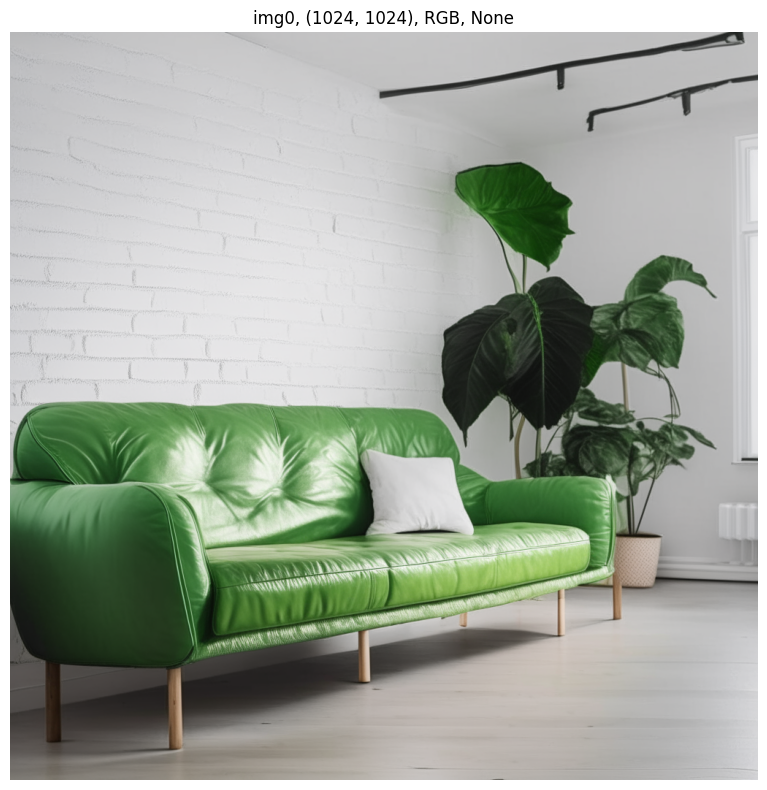

In [46]:
params['prompt'] = medium_prompt
params['strength'] = 0.65
params['generator'] = torch.Generator(device).manual_seed(seed)
pipe_result_medium = pipe(**params).images[0]

print(textwrap.fill(medium_prompt))
display_images([pipe_result_medium], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Промпт выполнен почти полностью (диван, стена, растение)
- ❌ Исходная композиция снова полностью проигнорирована
- ✅❌ Результат высокого качества, но это чистый txt2img

### Hard Prompt

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

A cozy living room in a wooden cabin at night. A green leather sofa
sits on a dark wood floor. A fire is burning in a stone fireplace on
the right. The only light comes from the fire and a small table lamp.
Moody, cinematic.


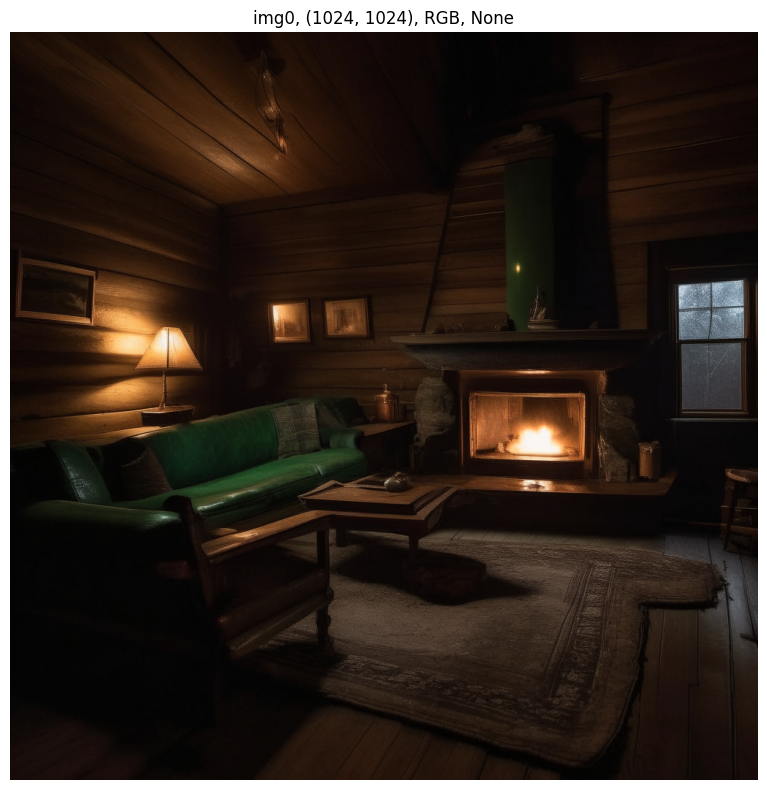

In [47]:
params['prompt'] = hard_prompt
params['strength'] = 0.8
params['generator'] = torch.Generator(device).manual_seed(seed)
pipe_result_hard = pipe(**params).images[0]

print(textwrap.fill(hard_prompt))
display_images([pipe_result_hard], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Отлично справилась с созданием сложной атмосферной сцены из промпта
- ❌ Связь с оригинальным изображением полностью отсутствует

### Comapring

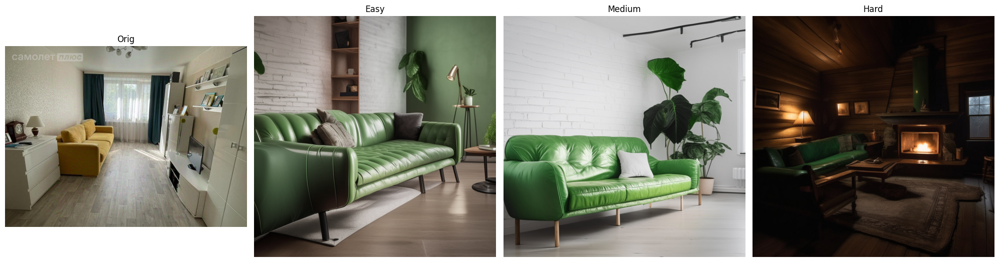

In [48]:
display_images(
    images=[img_pil, pipe_result_easy, pipe_result_medium, pipe_result_hard],
    titles=['Orig', 'Easy', 'Medium', 'Hard'],
    show_axes=False,
    figsize=(20, 12)
)

In [49]:
cleanup(pipe)

[Cleanup] Devcuda:2 | Allocated: 9418.40 MB | Reserved: 10912.00 MB


# Step2

## StableDiffusionXLControlNetImg2ImgPipeline

- https://huggingface.co/docs/diffusers/api/pipelines/controlnet_sdxl#diffusers.StableDiffusionXLControlNetImg2ImgPipeline

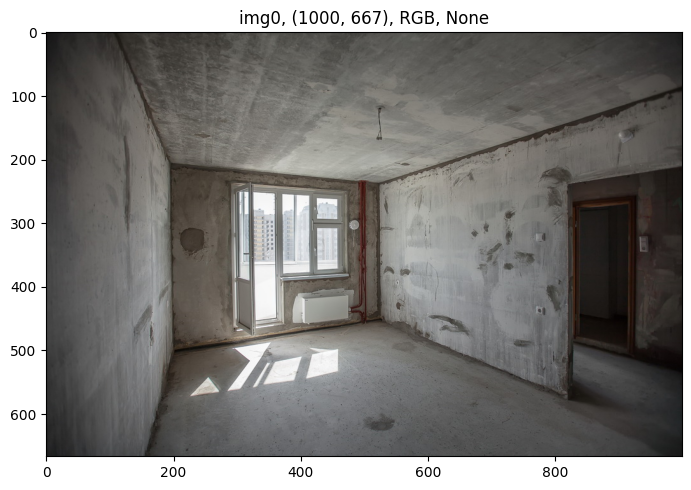

In [4]:
img_pil = Image.open('data/img5005_PrimaryHouse.jpg').convert('RGB')
display_images([img_pil])

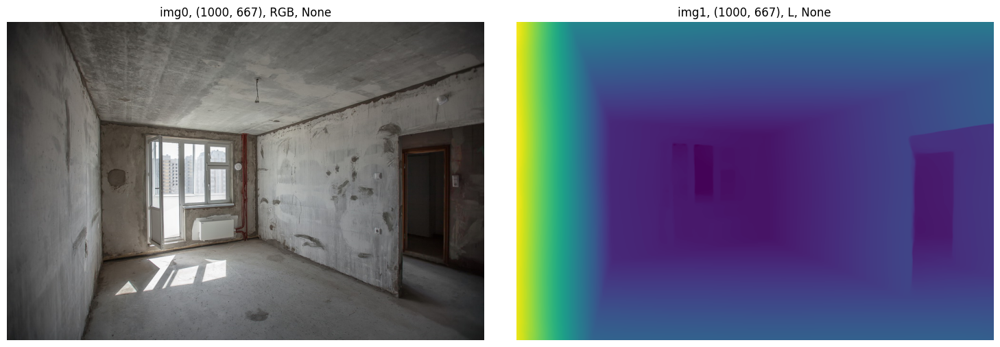

In [5]:
from transformers import DPTImageProcessor, DPTForDepthEstimation

device = 'cuda:2'

processor = DPTImageProcessor.from_pretrained("Intel/dpt-beit-large-512")
model = DPTForDepthEstimation.from_pretrained("Intel/dpt-beit-large-512")

# prepare image for the model
inputs = processor(images=img_pil, return_tensors="pt")
with torch.no_grad():
    outputs = model(**inputs)
    predicted_depth = outputs.predicted_depth

# interpolate to original size
prediction = torch.nn.functional.interpolate(
    predicted_depth.unsqueeze(1),
    size=img_pil.size[::-1],
    mode="bicubic",
    align_corners=False
)

# visualize the prediction
output = prediction.squeeze().cpu().numpy()
formatted = (output * 255 / np.max(output)).astype("uint8")
img_depth = Image.fromarray(formatted)
display_images([img_pil, img_depth], show_axes=False)

In [28]:
from diffusers import ControlNetModel, StableDiffusionXLControlNetImg2ImgPipeline

model_name = "stabilityai/stable-diffusion-xl-base-1.0"
controlnet_name = "diffusers/controlnet-depth-sdxl-1.0-small"
torch_dtype = torch.float16
device = 'cuda:2'
seed = 5

controlnet = ControlNetModel.from_pretrained(controlnet_name, variant="fp16", use_safetensors=True, torch_dtype=torch_dtype).to(device)
pipe = StableDiffusionXLControlNetImg2ImgPipeline.from_pretrained(model_name, controlnet=controlnet, variant="fp16", use_safetensors=True, torch_dtype=torch_dtype).to(device)
# pipe.enable_model_cpu_offload()

params = {
    "prompt": "New modern style of livingroom fulling of furniture, warm color palette, detailed, 8k",
    "negative_prompt": "low quality, bad quality, sketches",
    "image": img_pil,
    "control_image": img_depth,
    "strength": 0.9,
    "controlnet_conditioning_scale": 0.4,
    "guidance_scale": 12,
    "eta": 0.0,
    "num_inference_steps": 100,
    "generator": torch.Generator(device).manual_seed(seed)
}

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

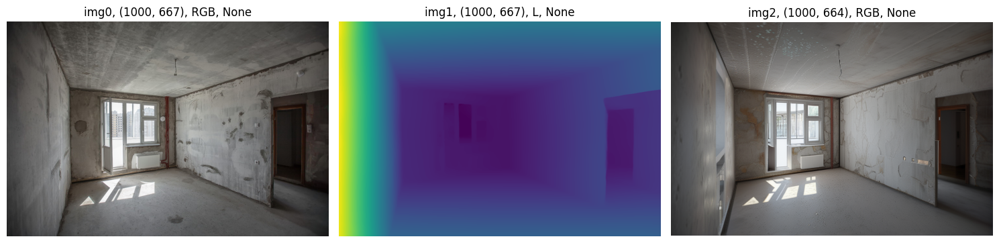

In [14]:
params["strength"] = 0.3
params["controlnet_conditioning_scale"] = 0.4
params["generator"] = torch.Generator(device).manual_seed(10)
pipe_result = pipe(**params)
display_images([img_pil, params['control_image']] + pipe_result.images, show_axes=False, figsize=(15, 10))

  0%|          | 0/65 [00:00<?, ?it/s]

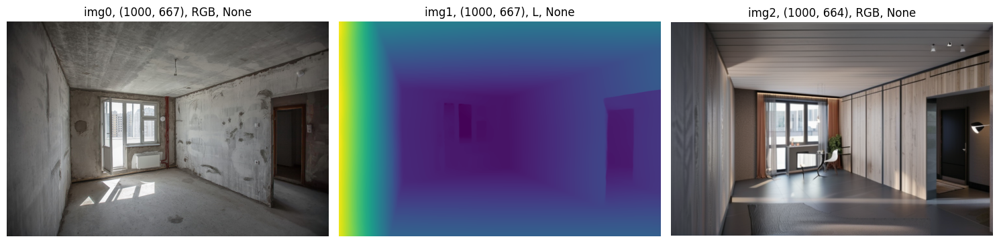

In [64]:
params["strength"] = 0.65
params["controlnet_conditioning_scale"] = 0.65
params["guidance_scale"] = 15
params["generator"] = torch.Generator(device).manual_seed(150)
pipe_result = pipe(**params)
display_images([img_pil, params['control_image']] + pipe_result.images, show_axes=False, figsize=(15, 10))

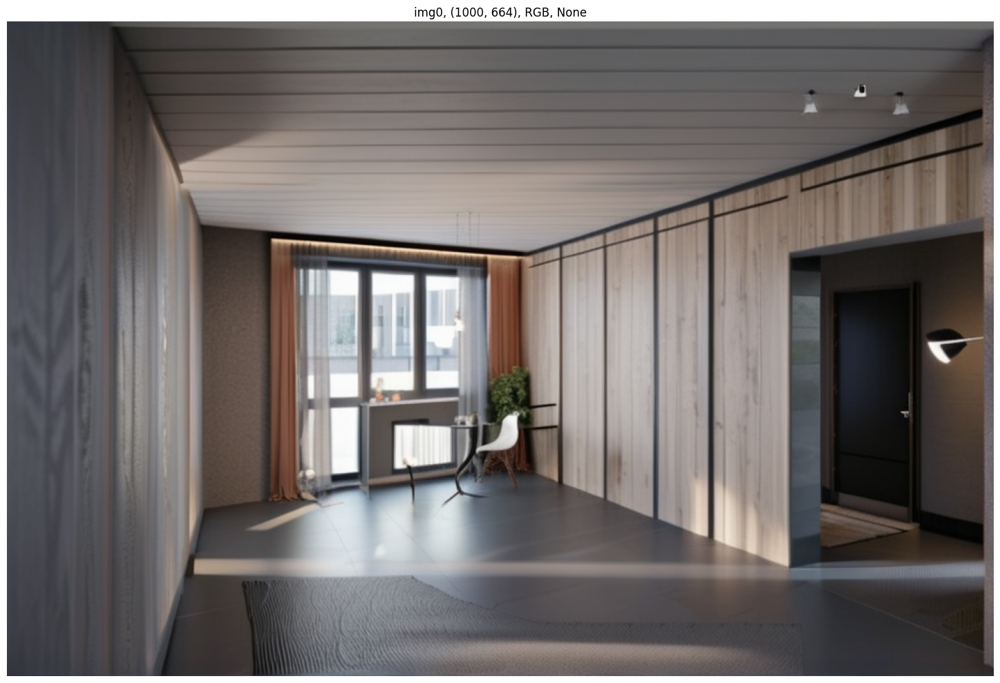

In [65]:
display_images(pipe_result.images, show_axes=False, figsize=(15, 10))